# Food Classification using TensorFlow (Transfer Learning)

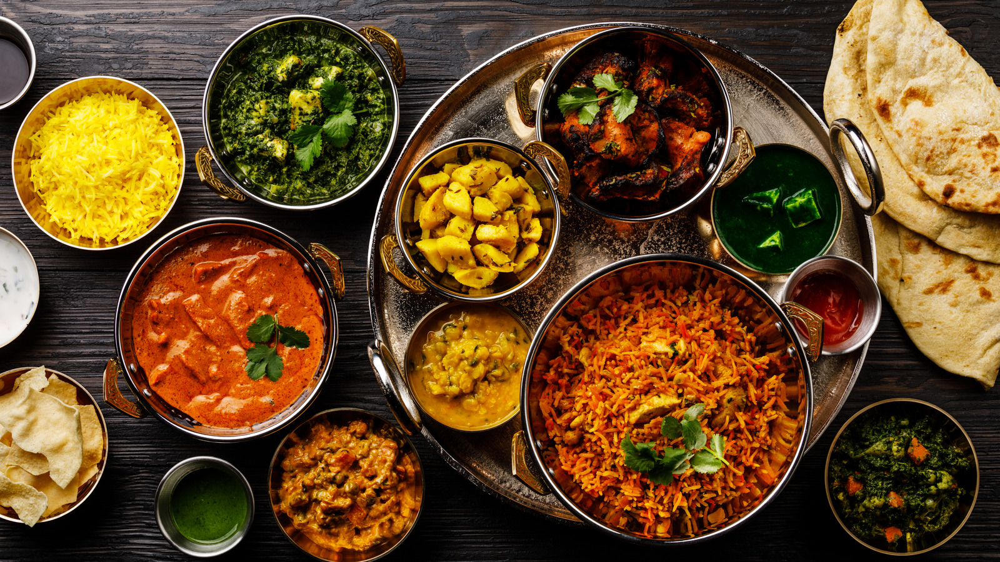


1. Image classification is a pivotal computer vision task that involves recognizing and categorizing images into predefined classes. This fundamental task serves as the cornerstone for solving various other computer vision challenges, including object detection, which can be further divided into semantic and instance segmentation.

2. At the forefront of image recognition and detection tasks stands Convolutional Neural Networks (CNNs). CNNs are composed of multiple layers with small neuron clusters, each specializing in capturing intricate details from different regions of an image.



In [ ]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

In [ ]:
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras import models
from PIL import Image
from skimage.io import imread
import cv2

K.clear_session()

### Problems Faced

## Dataset Refinement:

1. Addressing misspelled labels within the dataset.
  * Removing numerous unclassified or irrelevant raw images.


2. Unbiased Model Training:

  * Mitigating confusion caused by visually similar items sharing common attributes (e.g., distinguishing between fried samosa and pakode).
  * Handling instances where multiple labels coincide in a single image (e.g., a picture containing both Butter Naan and Dal Makhni).
  * Avoiding unintended feature selection due to the complexity of large transfer learning architectures (e.g., preventing the model from overemphasizing common condiments like ketchup and green chutney alongside items like pakode, samosa, and kathi rolls).

## IMAGE PROCESSSING

## Reshaping dimensions is a crucial step to prepare arrays for further processing.

In [ ]:
img = plt.imread('/content/drive/MyDrive/Food Data Set 35/French Fries/1008163.jpg')
dims = np.shape(img)
matrix = np.reshape(img, (dims[0] * dims[1], dims[2]))
print(np.shape(matrix))

(262144, 3)


Image shape ->  (512, 512)
Color channels ->  3
Min color depth : 0, Max color depth 255


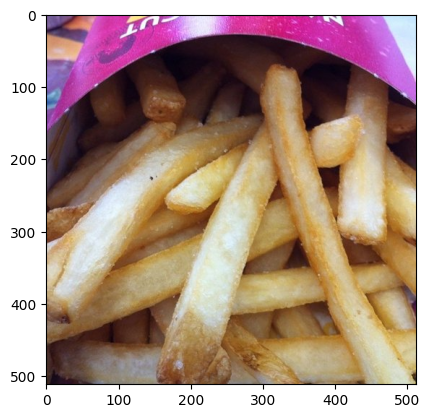

In [ ]:
plt.imshow(img)
print("Image shape -> ",dims[:2])
print("Color channels -> ",dims[2])
print("Min color depth : {}, Max color depth {}".format(np.min(img),np.max(img)))

## Plot for visualizing pixel intensities for RGB in color space
* A plot for visualizing pixel intensities in the RGB (Red, Green, Blue) color space is a valuable tool for understanding how colors are represented in an image. In the RGB color model, each pixel in an image is composed of three color channels: Red, Green, and Blue. The pixel's color is determined by the intensity values in these three channels.

1. A common way to visualize pixel intensities in RGB color space is to create a scatterplot or 3D plot, where each point represents a pixel in the image. Here's an explanation of why such a plot is useful:

2. Understanding Color Distribution: By visualizing the pixel intensities in the RGB color space, you can gain insights into the distribution of colors in an image. This helps in understanding the dominant colors, as well as the variations and nuances in the image's color palette.

3. Color Analysis: You can use the plot to analyze specific regions of the image by selecting clusters of points. For example, you can identify regions with similar color characteristics, which can be helpful in tasks like object recognition or segmentation.

4. Color Balance and Correction: Visualizing pixel intensities can reveal color imbalances or color cast issues in an image. This is particularly useful for color correction and image enhancement tasks, as you can adjust the color channels to achieve the desired look.

5. Quality Assessment: For quality control and image processing applications, the plot can be used to detect anomalies or outliers in color distribution. This can help identify image artifacts or errors.

6. Educational and Explanatory: When working with images, visualizing pixel intensities in RGB color space is an effective way to explain the concept of color channels and how they combine to create different colors. It's a useful tool for teaching and demonstrating color theory in digital image processing.

*  In summary, plotting pixel intensities in the RGB color space provides a powerful visual representation of how colors are distributed in an image. It aids in understanding, analyzing, and manipulating colors for various image processing tasks, making it an essential tool for both image analysis and computer graphics.

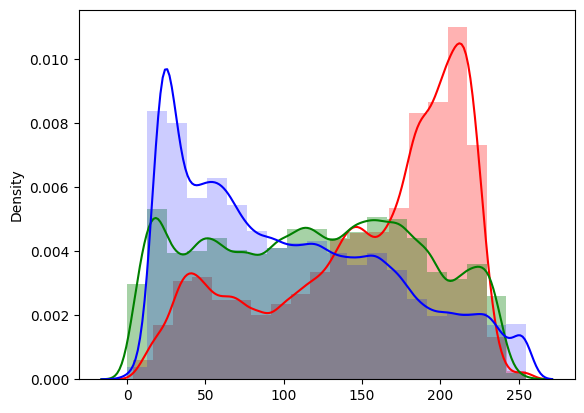

In [ ]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

## This code performs image segmentation using K-Means clustering with different values of n (the number of clusters or segments) and visualizes the segmented images.

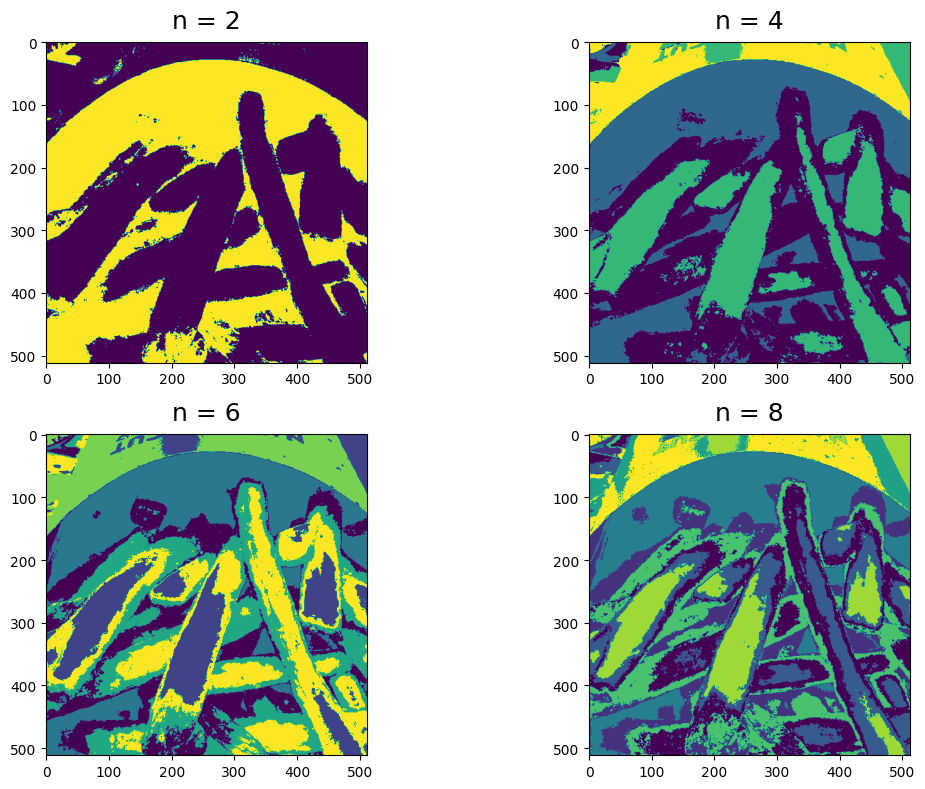

In [ ]:
from sklearn import cluster
n_vals=[2,4,6,8]
plt.figure(1, figsize=(12, 8))

for subplot,n in enumerate(n_vals):
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered, (dims[0], dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n), pad = 10,size=18)
    plt.imshow(clustered_img)

plt.tight_layout()

## This code creates a 2x2 grid of 3D scatter plots to visualize data points in RGB color space for different values of n. Each subplot represents a different value of n from the n_vals list and displays data points from the three color channels (Red, Green, Blue) in 3D space.

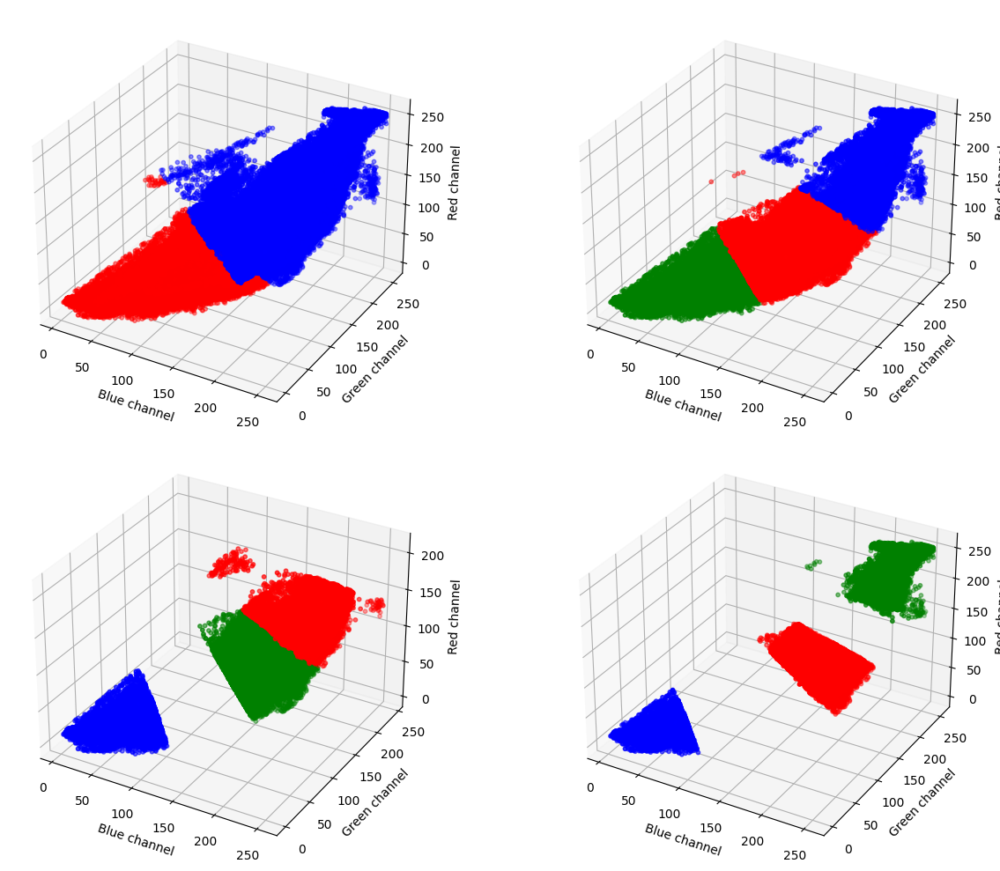

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig=plt.figure(figsize=(14,10))

ax = [fig.add_subplot(221, projection='3d'),
      fig.add_subplot(222, projection='3d'),
      fig.add_subplot(223, projection='3d'),
      fig.add_subplot(224, projection='3d')]

for plot_number,n in enumerate(n_vals):

    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    x1, y1, z1 = [np.where(clustered == x)[0] for x in [0, 1, 2]]

    plot_vals = [('r', x1),
                 ('b', y1),
                 ('g', z1),
                 ]

    for c, channel in plot_vals:
        x = matrix[channel, 0]
        y = matrix[channel, 1]
        z = matrix[channel, 2]
        ax[plot_number].scatter(x, y, z, c=c,s=10)

    ax[plot_number].set_xlabel('Blue channel')
    ax[plot_number].set_ylabel('Green channel')
    ax[plot_number].set_zlabel('Red channel')

plt.tight_layout()

## Brightness normalization is a technique that adjusts the range of pixel intensity values within an image. It is commonly used to enhance photographs suffering from low contrast, such as those affected by glare or other issues. This process is also known as contrast stretching or histogram stretching.

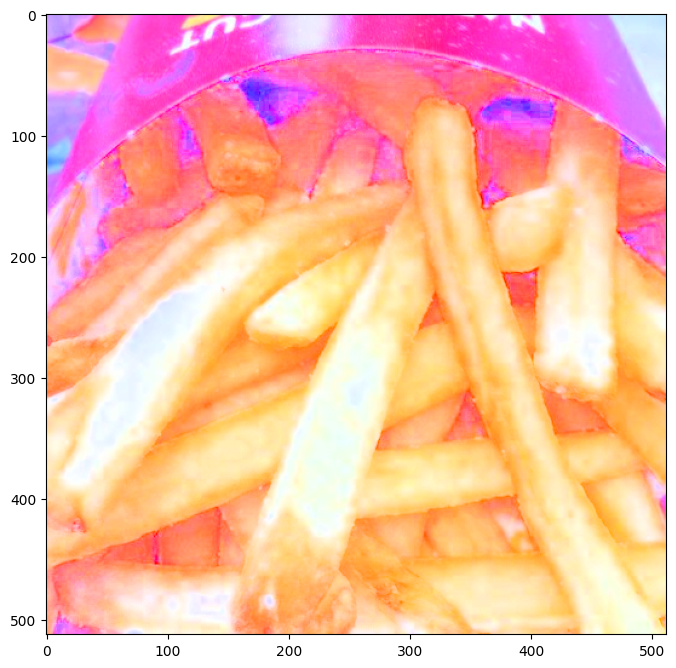

In [ ]:
bnorm = np.zeros_like(matrix, dtype=np.float32)
max_range = np.max(matrix, axis=1)
bnorm = matrix / np.vstack((max_range, max_range, max_range)).T
bnorm_img = np.reshape(bnorm, (dims[0],dims[1],dims[2]))
plt.figure(figsize=(8,10))
plt.imshow(bnorm_img)
plt.show()


### The Sobel filter is a fundamental method for generating an edge magnitude or gradient image. It operates by computing the intensity gradient at each pixel in an image. This filter identifies the direction of the most significant transition from light to dark and quantifies the rate of change in that particular direction.

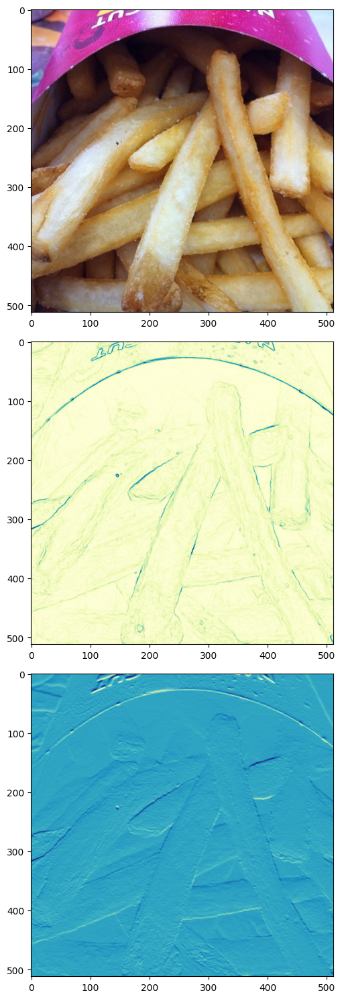

In [ ]:
import skimage
from skimage.feature import greycomatrix, greycoprops
from skimage.filters import sobel
from skimage.filters import sobel_h

plt.figure(1,figsize=(20,15))
cmap="YlGnBu"
plt.subplot(3,1,1)
plt.imshow(img)

plt.subplot(3,1,2)
plt.imshow(sobel(img[:,:,2]),cmap=cmap)

plt.subplot(3,1,3)
plt.imshow(sobel_h(img[:,:,1]), cmap=cmap)

plt.tight_layout()

### Let's utilize Principal Component Analysis (PCA), a linear dimensionality reduction technique, to extract valuable information from a high-dimensional space by projecting it into a lower-dimensional subspace. PCA is a powerful tool for reducing the complexity of data while preserving its essential characteristics.

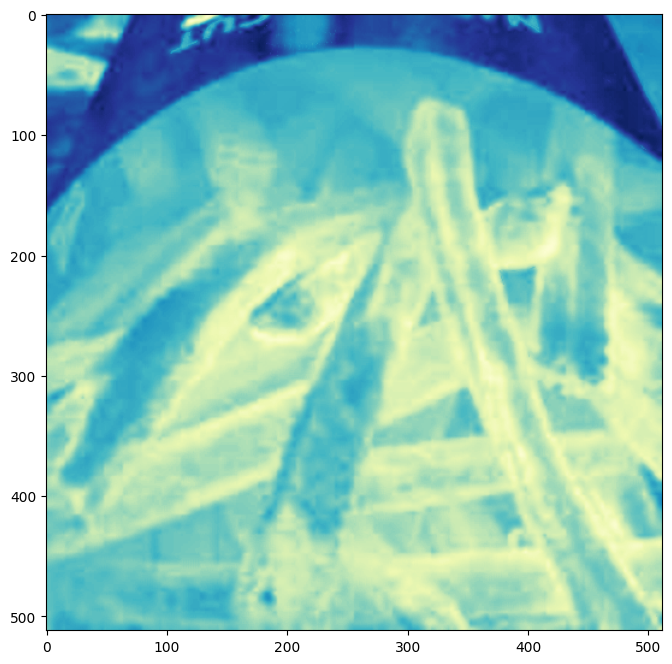

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(3)
pca.fit(matrix)
img_pca = pca.transform(matrix)
img_pca = np.reshape(img_pca, (dims[0], dims[1], dims[2]))

fig = plt.figure(figsize=(8, 8))
plt.imshow(img_pca[:,:,1], cmap=cmap)

## Exploratory Data Analysis (EDA)

#### We observe that three classes—Chappati and Panner tikka have an insufficient amount of training data. To address this issue, we'll employ data augmentation, specifically what's known as offline augmentation. This technique is suitable for relatively smaller datasets, as it augments the dataset size by a factor equal to the number of transformations performed. For instance, if we apply transformations like image flipping to all our images, it will effectively double the dataset size.

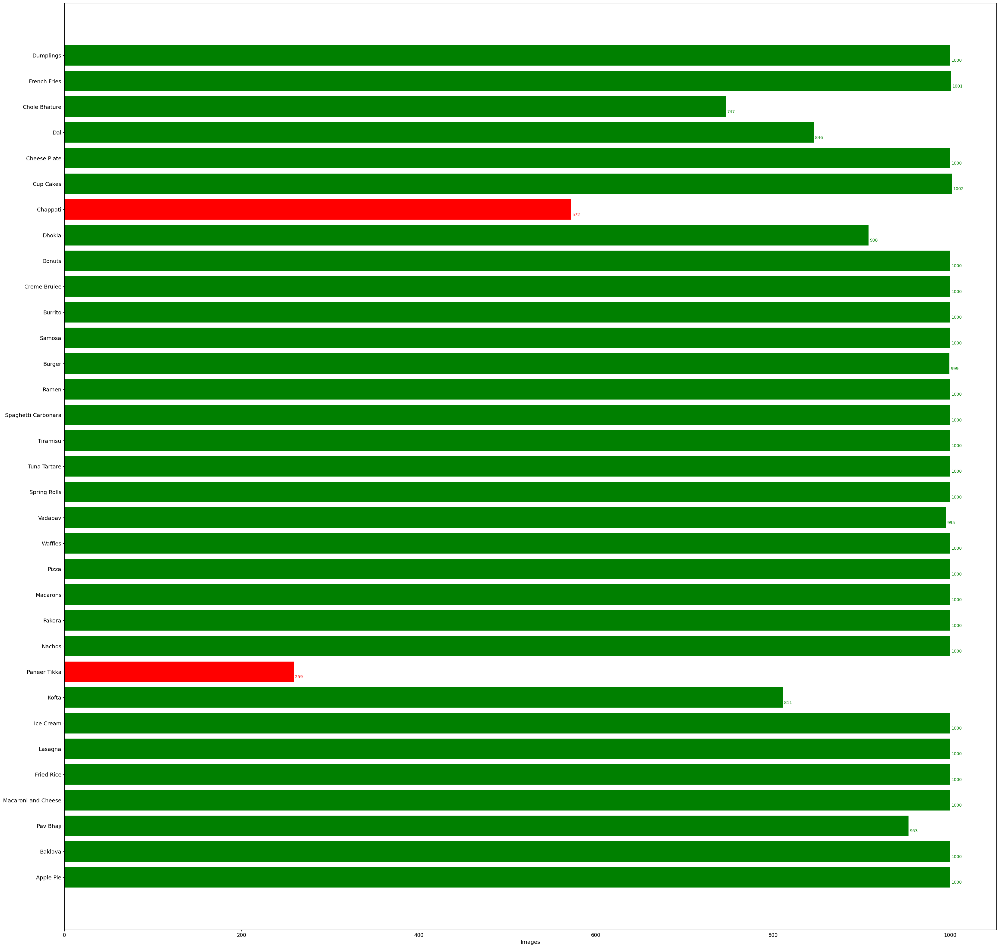

In [ ]:
main='/content/drive/MyDrive/Food Data Set 35'

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count


keys = data.keys()
values = data.values()

colors=["red" if x<= 600 else "green" for x in values]

fig, ax = plt.subplots(figsize=(40,40))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=13)
plt.xticks(color='black',fontsize=12)
plt.yticks(fontsize=13)
plt.show()

### To visualize our dataset, we can randomly select and display one image from each class. This provides an overview of the different classes in our dataset.

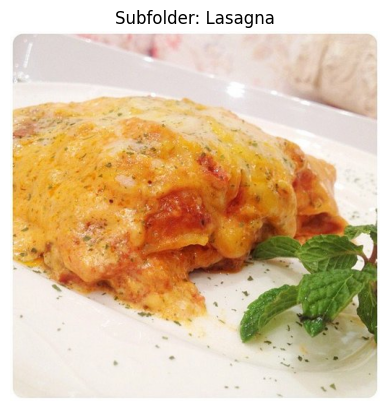

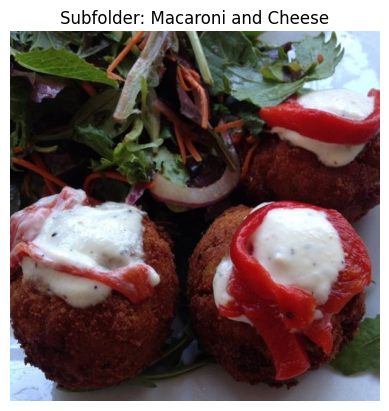

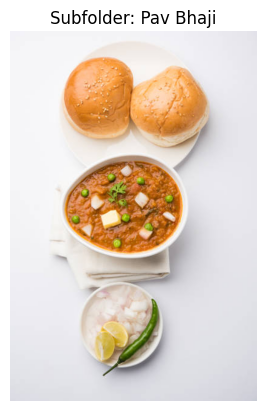

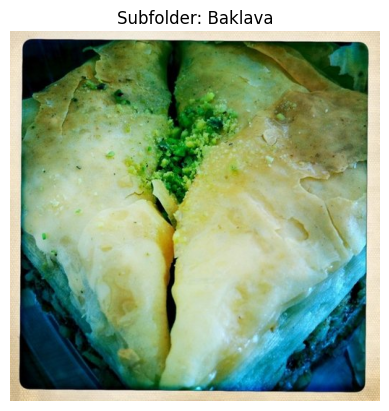

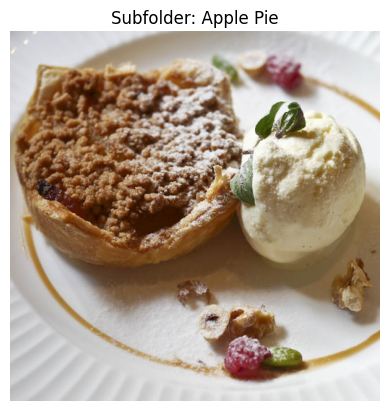

...

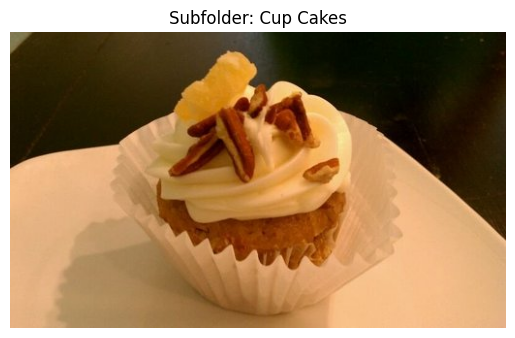

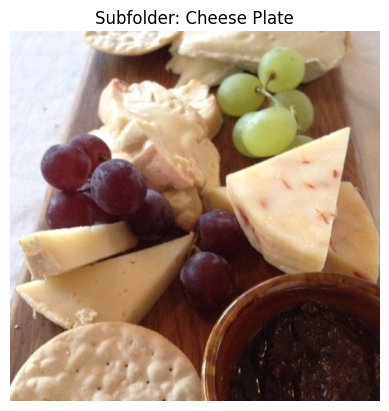

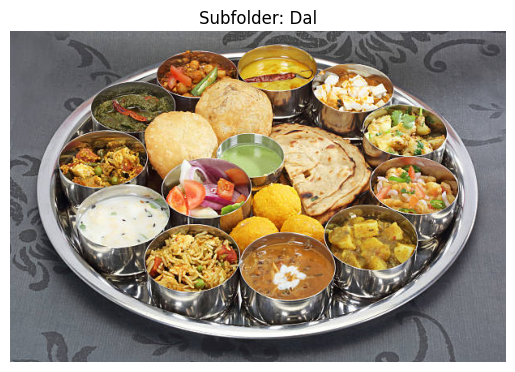

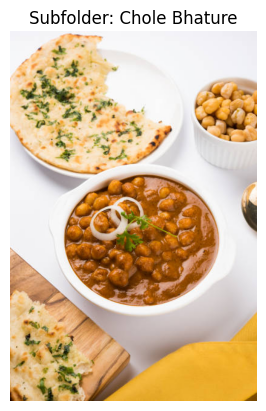

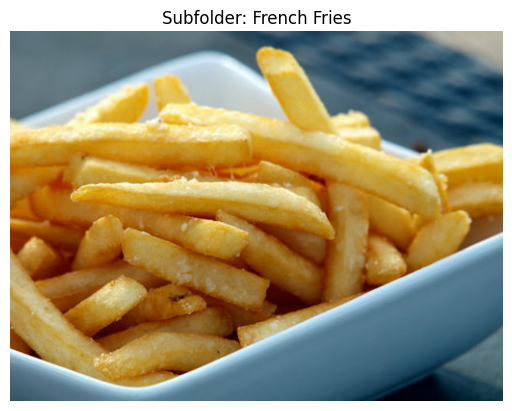

In [ ]:
import os
import matplotlib.pyplot as plt
import random

# Specify the path to the "train" folder containing subfolders with images
train_folder = '/content/drive/MyDrive/Train_Test_Valid/train'

# Get a list of subfolders (each subfolder contains images)
subfolders = [folder for folder in os.listdir(train_folder) if os.path.isdir(os.path.join(train_folder, folder))]

# Iterate through the subfolders
for subfolder in subfolders:
    # Get a list of image files in the current subfolder
    image_files = [f for f in os.listdir(os.path.join(train_folder, subfolder)) if f.endswith('.jpg')]

    # Check if there are any image files in the subfolder
    if image_files:
        # Select a random image file from the list
        random_image = random.choice(image_files)

        # Get the full path to the selected image
        image_path = os.path.join(train_folder, subfolder, random_image)

        # Load and plot the selected image
        img = plt.imread(image_path)
        plt.imshow(img)
        plt.title(f'Subfolder: {subfolder}')
        plt.axis('off')  # Turn off axis labels
        plt.show()


1. Take a batch of images designated for training.

2. Apply a sequence of random transformations to each image within the batch. These transformations may include random rotations, resizing, shearing, and more.

3. Substitute the original batch with this freshly generated batch containing the randomly transformed images.

4. Train the Convolutional Neural Network (CNN) using this batch of randomly transformed data. Notably, the original data itself is not directly utilized for training in this process.

## MODEL TRAINING

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 32 # total number of classes check kar liyio len(data) maybe
batch_size = 16
img_width, img_height = 299, 299

train_data_dir = '/content/drive/MyDrive/Train_Test_Valid/train'

# Data Augmentation with ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

val_data_dir = '/content/drive/MyDrive/Train_Test_Valid/val'

val_datagen = ImageDataGenerator(rescale=1. / 255)

val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 17325 images belonging to 32 classes.
Found 2254 images belonging to 32 classes.


In [ ]:
class_map = train_generator.class_indices
class_map

{'Apple Pie': 0,
 'Baklava': 1,
 'Burger': 2,
 'Burrito': 3,
 'Chappati': 4,
 'Cheese Plate': 5,
 'Chole Bhature': 6,
 'Creme Brulee': 7,
 'Cup Cakes': 8,
 'Dal': 9,
 'Dhokla': 10,
 'Donuts': 11,
 'French Fries': 12,
 'Fried Rice': 13,
 'Ice Cream': 14,
 'Kofta': 15,
 'Lasagna': 16,
 'Macaroni and Cheese': 17,
 'Macarons': 18,
 'Nachos': 19,
 'Pakora': 20,
 'Paneer Tikka': 21,
 'Pav Bhaji': 22,
 'Pizza': 23,
 'Ramen': 24,
 'Samosa': 25,
 'Spaghetti Carbonara': 26,
 'Spring Rolls': 27,
 'Tiramisu': 28,
 'Tuna Tartare': 29,
 'Vadapav': 30,
 'Waffles': 31}

In [ ]:
class2_map = val_generator.class_indices
class2_map

{'Apple Pie': 0,
 'Baklava': 1,
 'Burger': 2,
 'Burrito': 3,
 'Chappati': 4,
 'Cheese Plate': 5,
 'Chole Bhature': 6,
 'Creme Brulee': 7,
 'Cup Cakes': 8,
 'Dal': 9,
 'Dhokla': 10,
 'Donuts': 11,
 'French Fries': 12,
 'Fried Rice': 13,
 'Ice Cream': 14,
 'Kofta': 15,
 'Lasagna': 16,
 'Macaroni and Cheese': 17,
 'Macarons': 18,
 'Nachos': 19,
 'Pakora': 20,
 'Paneer Tikka': 21,
 'Pav Bhaji': 22,
 'Pizza': 23,
 'Ramen': 24,
 'Samosa': 25,
 'Spaghetti Carbonara': 26,
 'Spring Rolls': 27,
 'Tiramisu': 28,
 'Tuna Tartare': 29,
 'Vadapav': 30,
 'Waffles': 31}

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
# from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
# from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten

from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2

from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import SGD


inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(n_classes,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer= SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

callback = EarlyStopping(
    monitor="val_loss",
    min_delta=0.00001,
    patience=3,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True
)


history = model.fit_generator( generator = train_generator,
                   steps_per_epoch = 400,
                    validation_data=val_generator,
                    epochs=10,
                    verbose=1,
                    callbacks=callback)

Epoch 1/10
400/400 [==============================] - 2029s 5s/step - loss: 2.2115 - accuracy: 0.4381 - val_loss: 6.7094 - val_accuracy: 0.1815
Epoch 2/10
400/400 [==============================] - 899s 2s/step - loss: 1.6527 - accuracy: 0.5834 - val_loss: 2.3529 - val_accuracy: 0.3886
Epoch 3/10
400/400 [==============================] - 656s 2s/step - loss: 1.3571 - accuracy: 0.6625 - val_loss: 1.7144 - val_accuracy: 0.5839
Epoch 4/10
400/400 [==============================] - 474s 1s/step - loss: 1.2763 - accuracy: 0.6769 - val_loss: 2.1061 - val_accuracy: 0.4862
Epoch 5/10
400/400 [==============================] - 354s 887ms/step - loss: 1.1107 - accuracy: 0.7128 - val_loss: 3.3299 - val_accuracy: 0.3988
Epoch 6/10
400/400 [==============================] - 347s 867ms/step - loss: 1.1060 - accuracy: 0.7181 - val_loss: 1.2853 - val_accuracy: 0.6766
Epoch 7/10
400/400 [==============================] - 271s 677ms/step - loss: 0.9814 - accuracy: 0.7548 - val_loss: 2.2342 - val_accura

In [ ]:
model.fit_generator(generator = train_generator,
                   steps_per_epoch = 800,
                    validation_data=val_generator,
                    epochs=10,
                    verbose=1,
                    callbacks=callback)

Epoch 1/10
800/800 [==============================] - 417s 520ms/step - loss: 1.0097 - accuracy: 0.7468 - val_loss: 1.5754 - val_accuracy: 0.6513
Epoch 2/10
800/800 [==============================] - 390s 487ms/step - loss: 0.8925 - accuracy: 0.7758 - val_loss: 1.2929 - val_accuracy: 0.7041
Epoch 3/10
800/800 [==============================] - 381s 476ms/step - loss: 0.8369 - accuracy: 0.7927 - val_loss: 1.5679 - val_accuracy: 0.6193
Epoch 4/10
800/800 [==============================] - 379s 474ms/step - loss: 0.7829 - accuracy: 0.8093 - val_loss: 1.1636 - val_accuracy: 0.7427
Epoch 5/10
800/800 [==============================] - 374s 468ms/step - loss: 0.7113 - accuracy: 0.8274 - val_loss: 1.1145 - val_accuracy: 0.7489
Epoch 6/10
800/800 [==============================] - 383s 478ms/step - loss: 0.6567 - accuracy: 0.8407 - val_loss: 1.0975 - val_accuracy: 0.7684
Epoch 7/10
800/800 [==============================] - 388s 484ms/step - loss: 0.6370 - accuracy: 0.8448 - val_loss: 1.0390 -

UnknownError: ignored

In [ ]:
model.fit_generator(generator = train_generator,
                   #steps_per_epoch = 800,
                    validation_data=val_generator,
                    epochs=5,
                    verbose=1,
                    callbacks=callback)

Epoch 1/5
1083/1083 [==============================] - 502s 463ms/step - loss: 0.4987 - accuracy: 0.8843 - val_loss: 0.8501 - val_accuracy: 0.8066
Epoch 2/5
1083/1083 [==============================] - 506s 466ms/step - loss: 0.5044 - accuracy: 0.8813 - val_loss: 1.1447 - val_accuracy: 0.7502
Epoch 3/5
1083/1083 [==============================] - 507s 468ms/step - loss: 0.4559 - accuracy: 0.8940 - val_loss: 1.0174 - val_accuracy: 0.7777
Epoch 4/5
1083/1083 [==============================] - 503s 464ms/step - loss: 0.4482 - accuracy: 0.8951 - val_loss: 1.2046 - val_accuracy: 0.7311
Epoch 4: early stopping


In [ ]:
model.save('/content/drive/MyDrive/image_to_recipie_model.h5')

In [ ]:
def plot_accuracy(history):

    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()

def plot_loss(history):

    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()


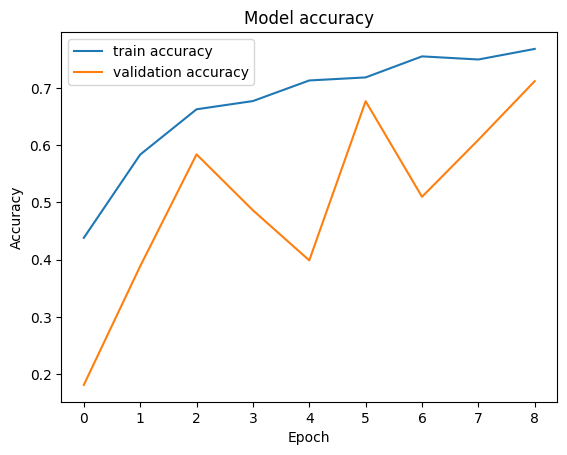

In [ ]:
plot_accuracy(history)

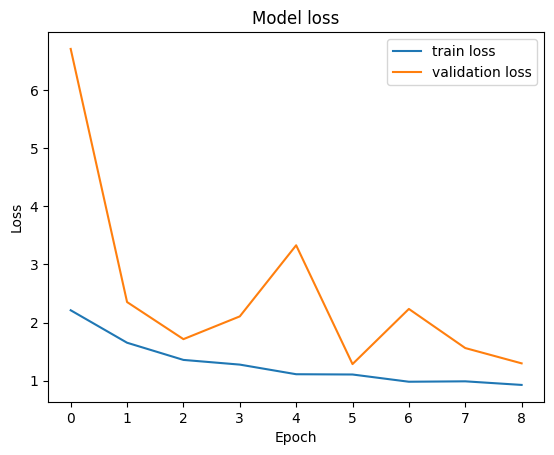

In [ ]:
plot_loss(history)

## PREDICTIONS

In [ ]:
K.clear_session()
path_to_model='/content/drive/MyDrive/image_to_recipie_model.h5'
model = load_model(path_to_model)
print("Model is loaded.......")

Model is loaded.......


## Testing model on test set

In [ ]:
test_data_dir = '/content/drive/MyDrive/Train_Test_Valid/test'

test_datagen = ImageDataGenerator(rescale=1. / 255)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 3018 images belonging to 32 classes.


In [ ]:
scores = model.evaluate_generator(test_generator)

print("Test Accuracy: {:.3f}".format(scores[1]))

Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636Test Accuracy: 0.636

In [ ]:
category= train_generator.class_indices # check one time before running

## Predict on a Single Image

In [ ]:
def predict_image(filename,model):
    img_ = image.load_img(filename, target_size=(299, 299))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(category[index][1]))
    plt.imshow(img_array)

# Predict on a Directory

In [ ]:
def predict_dir(filedir,model):
    cols=5
    pos=0
    images=[]
    total_images=len(os.listdir(filedir))
    rows=total_images//cols + 1

    true=filedir.split('/')[-1]

    fig=plt.figure(1, figsize=(25, 25))

    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir,i))

    for subplot,imggg in enumerate(images):
        img_ = image.load_img(imggg, target_size=(299, 299))
        img_array = image.img_to_array(img_)

        img_processed = np.expand_dims(img_array, axis=0)

        img_processed /= 255.
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)

        pred=category.get(index)[0]
        if pred==true:
            pos+=1

        fig=plt.subplot(rows, cols, subplot+1)
        fig.set_title(category.get(index)[1], pad = 10,size=18)
        plt.imshow(img_array)

    acc=pos/total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc,pos=pos,total=total_images))
    plt.tight_layout()

# Single Image Prediction

In [ ]:
predict_image('/content/drive/MyDrive/Train_Test_Valid/train/Macaroni and Cheese/1024001.jpg',model)

1/1 [==============================] - 0s 27ms/step


KeyError: ignored

In [ ]:
# predict_dir("path directory of the images",model)

### Certainly, let's create a confusion matrix to visualize the performance of our model for all the food items. A confusion matrix provides insights into how well the model is classifying each food item and helps identify any misclassifications.

# Add some confusion matrix photos

In [ ]:
from sklearn.metrics import confusion_matrix
import itertools

img_width, img_height = 299, 299

def labels_confusion_matrix():
    folder_path="path to the test folder"

    mapping={}
    for i,j in enumerate(sorted(os.listdir(folder_path))):
        mapping[j]=i

    files=[]
    real=[]
    predicted=[]

    for i in os.listdir(folder_path):

        true=os.path.join(folder_path,i)
        true=true.split('/')[-1]
        true=mapping[true]

        for j in os.listdir(os.path.join(folder_path,i)):

            img_ = image.load_img(os.path.join(folder_path,i,j), target_size=(img_height, img_width))
            img_array = image.img_to_array(img_)
            img_processed = np.expand_dims(img_array, axis=0)
            img_processed /= 255.
            prediction = model.predict(img_processed)
            index = np.argmax(prediction)

            predicted.append(index)
            real.append(true)

    return (real,predicted)

def print_confusion_matrix(real,predicted):

    cmap="viridis"
    cm_plot_labels = [i for i in range(20)]

    cm = confusion_matrix(y_true=real, y_pred=predicted)
    df_cm = pd.DataFrame(cm,cm_plot_labels,cm_plot_labels)
    sns.set(font_scale=1.1)
    plt.figure(figsize = (15,10))
    s=sns.heatmap(df_cm, annot=True,cmap=cmap) # font size
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('confusion_matrix.png')
    plt.show()

In [ ]:
y_true,y_pred=labels_confusion_matrix()
print_confusion_matrix(y_true,y_pred)

# MODEL VISUALIZATIONS

### Certainly, here are some helper functions and techniques that can enable you to visualize how a neural network works and performs 🥰

In [ ]:
def get_activations(img, model_activations):
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img /= 255.
    plt.imshow(img[0])
    plt.show()
    return model_activations.predict(img)


In [ ]:
def show_activations(activations, layer_names):

    images_per_row = 16

    for layer_name, layer_activation in zip(layer_names, activations):
        n_features = layer_activation.shape[-1]

        size = layer_activation.shape[1]

        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,:, :,col * images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,row * size : (row + 1) * size] = channel_image

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

    plt.show()



In [ ]:
def activation_conv():
    first_convlayer_activation = activations[0]
    second_convlayer_activation = activations[3]
    third_convlayer_activation = activations[6]
    f,ax = plt.subplots(1,3, figsize=(10,10))
    ax[0].imshow(first_convlayer_activation[0, :, :, 3], cmap='viridis')
    ax[0].axis('OFF')
    ax[0].set_title('Conv2d_1')
    ax[1].imshow(second_convlayer_activation[0, :, :, 3], cmap='viridis')
    ax[1].axis('OFF')
    ax[1].set_title('Conv2d_2')
    ax[2].imshow(third_convlayer_activation[0, :, :, 3], cmap='viridis')
    ax[2].axis('OFF')
    ax[2].set_title('Conv2d_3')



In [ ]:
def get_attribution(food):

    tf.compat.v1.disable_eager_execution()

    img = image.load_img(food, target_size=(299, 299))
    img = image.img_to_array(img)
    img /= 255.
    f,ax = plt.subplots(1,3, figsize=(15,15))
    ax[0].imshow(img)

    img = np.expand_dims(img, axis=0)
    model = load_model('/content/drive/MyDrive/image_to_recipie_model.h5')

    preds = model.predict(img)
    class_id = np.argmax(preds[0])
    ax[0].set_title("Input Image")
    class_output = model.output[:, class_id]
    last_conv_layer = model.get_layer("mixed10")

    grads = K.gradients(class_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([img])
    for i in range(2048):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    ax[1].imshow(heatmap)
    ax[1].set_title("Heat map")


    act_img = cv2.imread(food)
    heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
    cv2.imwrite('classactivation.png', superimposed)
    img_act = image.load_img('classactivation.png', target_size=(299, 299))
    ax[2].imshow(img_act)
    ax[2].set_title("Class Activation")
    plt.show()
    return preds

In [ ]:
print("Total layers in the model : ",len(model.layers),"\n")

# We start with index 1 instead of 0, as input layer is at index 0
layers = [layer.output for layer in model.layers[1:11]]
# We now initialize a model which takes an input and outputs the above chosen layers
activations_output = models.Model(inputs=model.input, outputs=layers)
# print(layers)

layer_names = []
for layer in model.layers[1:11]:
    layer_names.append(layer.name)

print("First 10 layers which we can visualize are -> ", layer_names)

## LAYER WISE ACTIVATIONS

In [ ]:
food = '/content/drive/MyDrive/Train_Test_Valid/train/Burger/1009426.jpg'
activations = get_activations(food,activations_output)
show_activations(activations, layer_names)

## Let's show the activation outputs of Conv2D layer (we have three of them in first 10 layers) to compare how layers get abstract with depth.

In [ ]:
activation_conv()

In [ ]:
food = '/content/drive/MyDrive/Train_Test_Valid/train/Samosa/1027474.jpg'
activations = get_activations(food,activations_output)
show_activations(activations, layer_names)

In [ ]:
activation_conv()

### Indeed, generating heatmaps using gradients is a powerful technique to understand how a neural network attributes features to class outputs. This method, often called "Class Activation Mapping" or CAM, helps highlight the regions in input images that were crucial in making classification decisions. Here's how it works:

1. Select the Last Convolutional Layer: Identify the last convolutional layer in your neural network architecture. This layer is often where the network captures high-level features.

2. Extract Weights and Activations: Retrieve the weights and activations of this last convolutional layer. The weights represent the importance of different feature maps, and the activations reflect the spatial information within the feature maps.

3. Calculate Class Scores: After a forward pass, calculate the class scores for the image using the network's final fully connected layer or softmax layer.

4. Compute Gradients: Compute the gradients of the class score with respect to the activations in the last convolutional layer. This gradient provides information on how the class score changes concerning the activations.

5. Weighted Sum: Multiply the gradients by the weights of the feature maps and sum them up. This weighted sum indicates how much each region of the feature maps contributed to the class score.

6. Heatmap Generation: Finally, apply a suitable activation function (e.g., ReLU) to the weighted sum to generate the heatmap. The heatmap highlights the regions in the input image that were most influential in determining the class prediction.

7. Overlay Heatmap on Image: Overlay the heatmap on the input image to visualize which parts of the image were crucial for the model's decision.

8. By following these steps, you can create heatmaps that visually explain the model's decision-making process. These heatmaps help interpret why the model assigned a particular class label to an image and provide valuable insights into model behavior and feature attribution.

This technique is especially useful in applications such as image classification and object detection, where understanding the model's reasoning can aid in model validation and debugging.

## GENERATING HEATMAPS

In [ ]:
pred = get_attribution('/content/drive/MyDrive/Train_Test_Valid/train/Pakora/00000007_resized.png')

In [ ]:
pred2=get_attribution('/content/drive/MyDrive/Train_Test_Valid/train/Fried Rice/1028159.jpg')

In [ ]:
pred3=get_attribution('/content/drive/MyDrive/Train_Test_Valid/train/Ramen/1019704.jpg')

In [ ]:
pred4=get_attribution('/content/drive/MyDrive/Train_Test_Valid/train/Ramen/1015129.jpg')

In [ ]:
pred5 = get_attribution('/content/drive/MyDrive/Train_Test_Valid/train/Spaghetti Carbonara/1017522.jpg')